In [1]:
import xarray
import matplotlib.pyplot as plt

In [2]:
ecIndexXr = xarray.open_dataset('../results/cmip6ssp585EcIndex.nc').sel(year=slice(1850,2099))

In [3]:
ecIndexXr

<xarray.Dataset>
Dimensions:  (model: 38, year: 250)
Coordinates:
  * year     (year) int64 1850 1851 1852 1853 1854 ... 2095 2096 2097 2098 2099
  * model    (model) object 'ACCESS-CM2' 'ACCESS-ESM1-5' ... 'UKESM1-0-LL'
Data variables:
    eIndex   (model, year) float64 ...
    cIndex   (model, year) float64 ...
Attributes:
    experiment:  ssp585

In [4]:
tradIndexXr= xarray.open_dataset('../results/cmip6ssp585TradIndecesTos.nc').sel(year=slice(1850,2099))

In [5]:
tradIndexXr

<xarray.Dataset>
Dimensions:          (model: 38, year: 250)
Coordinates:
  * year             (year) int64 1850 1851 1852 1853 ... 2096 2097 2098 2099
  * model            (model) object 'ACCESS-CM2' ... 'UKESM1-0-LL'
Data variables:
    nino4NoDetrend   (model, year) float64 ...
    sam              (model, year) float64 ...
    dmi              (model, year) float64 ...
    nino4            (model, year) float64 ...
    nino34           (model, year) float64 ...
    eastIO           (model, year) float64 ...
    nino34NoDetrend  (model, year) float64 ...
    eastIONoDetrend  (model, year) float64 ...
Attributes: (12/16)
    experiment:       ssp585
    nino34NoDetrend:  [ 7 15]
    nino4NoDetrend:   [ 7 15]
    eastIONoDetrend:  [ 7 12]
    dmi:              [ 7 12]
    nino34:           [ 7 15]
    ...               ...
    lat2:             [10 15]
    precAnom:         [10 15]
    tsAnom:           [10 15]
    enso:             [12 14]
    eIndex:           [ 7 15]
    cIndex:           [ 7 15]

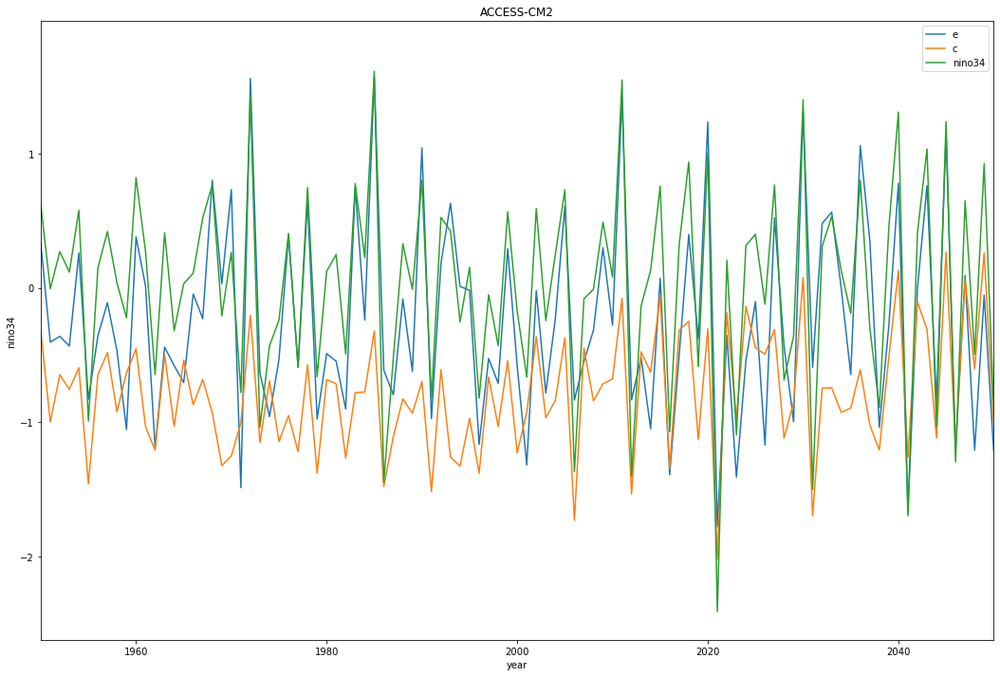

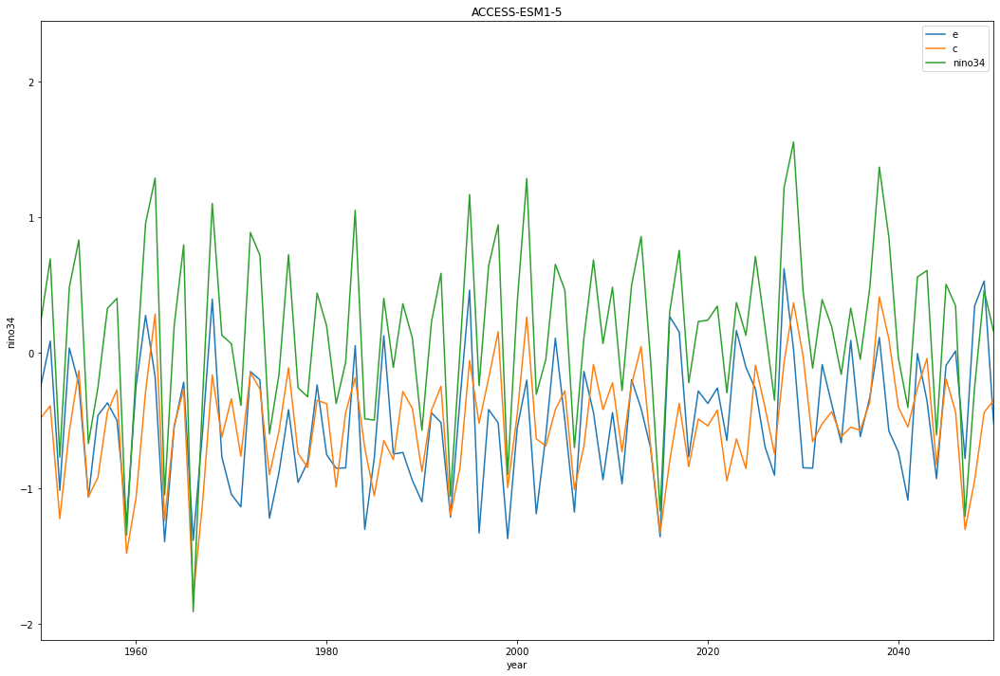

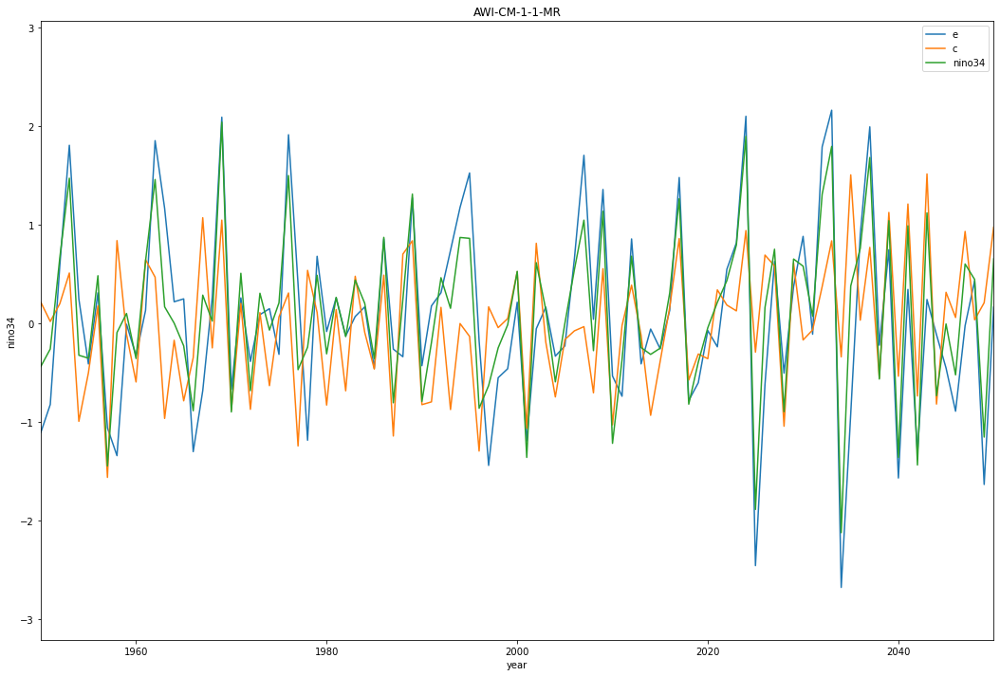

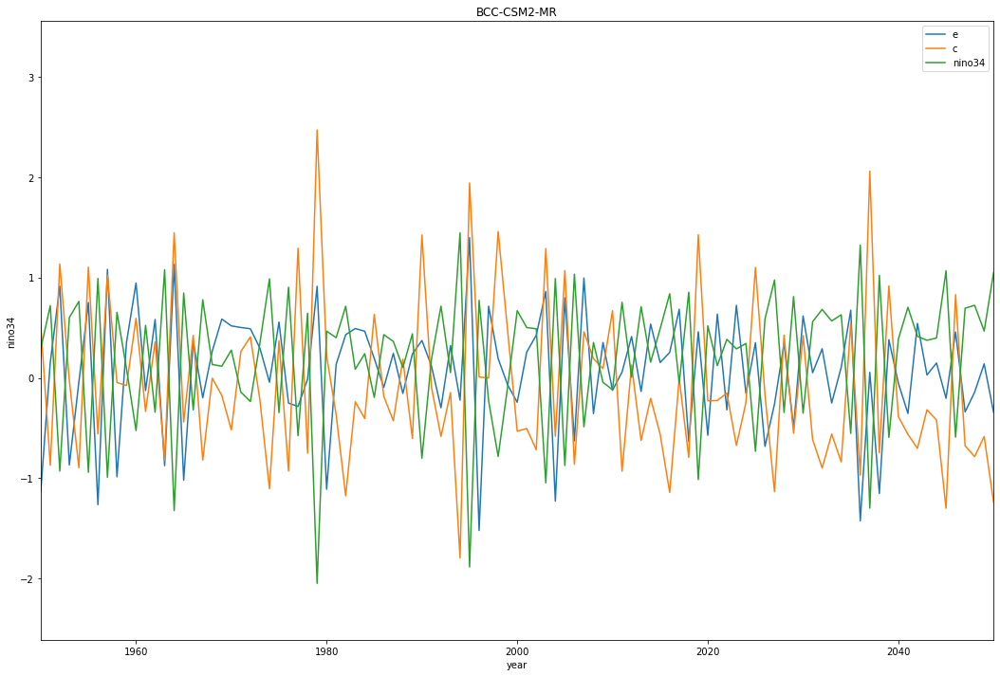

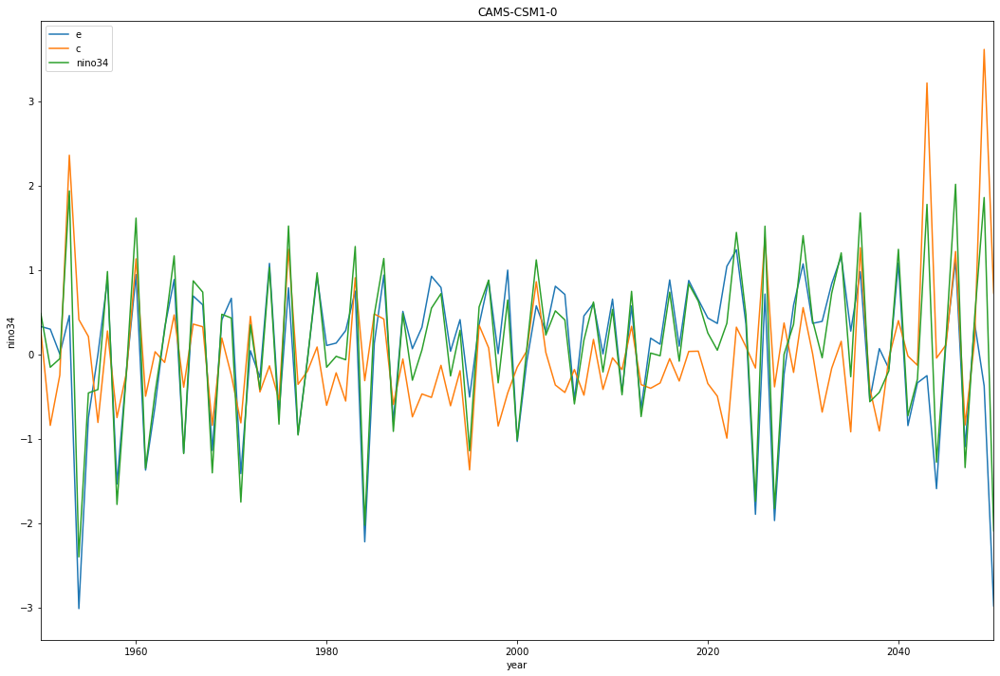

...

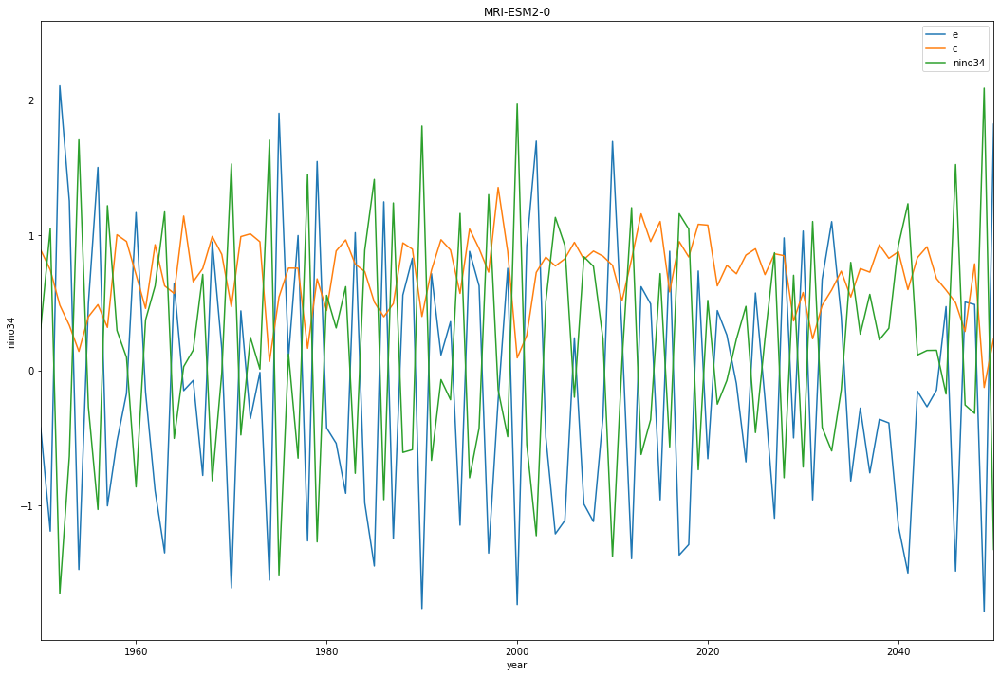

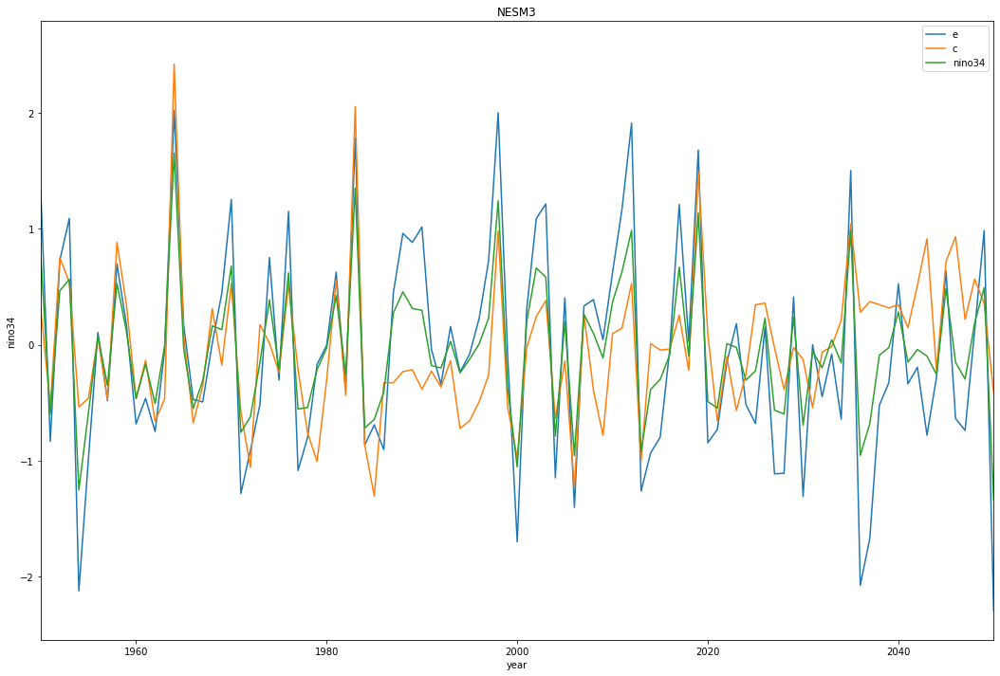

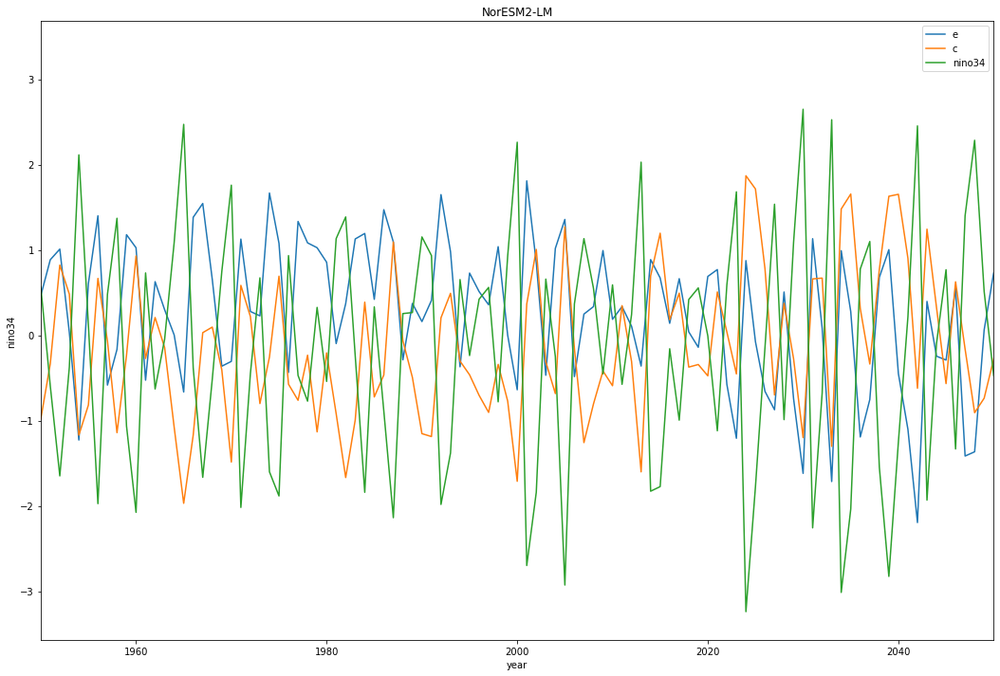

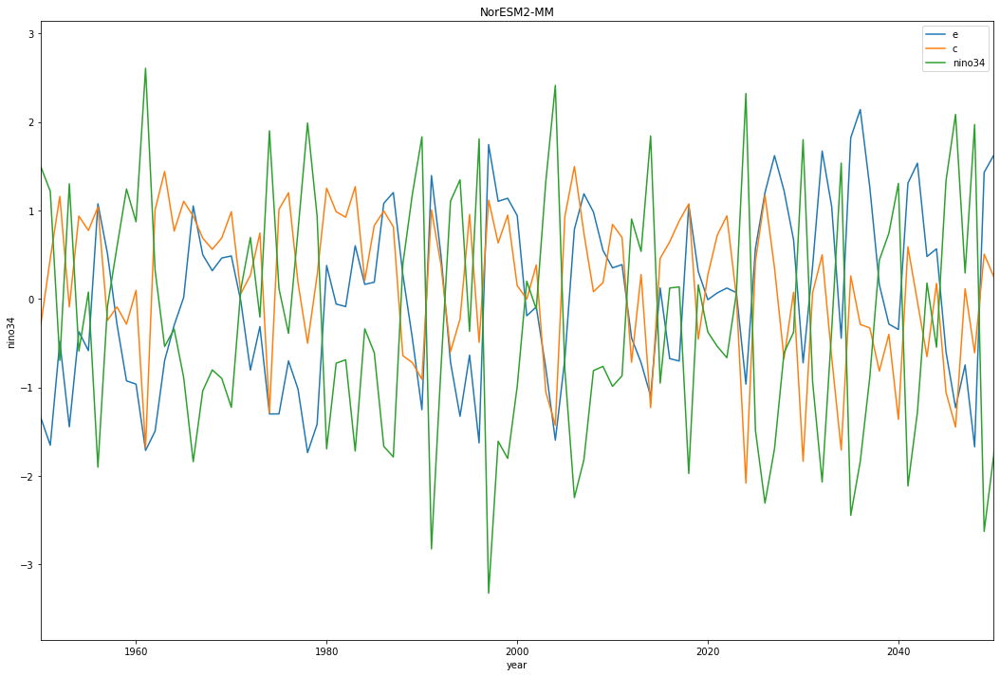

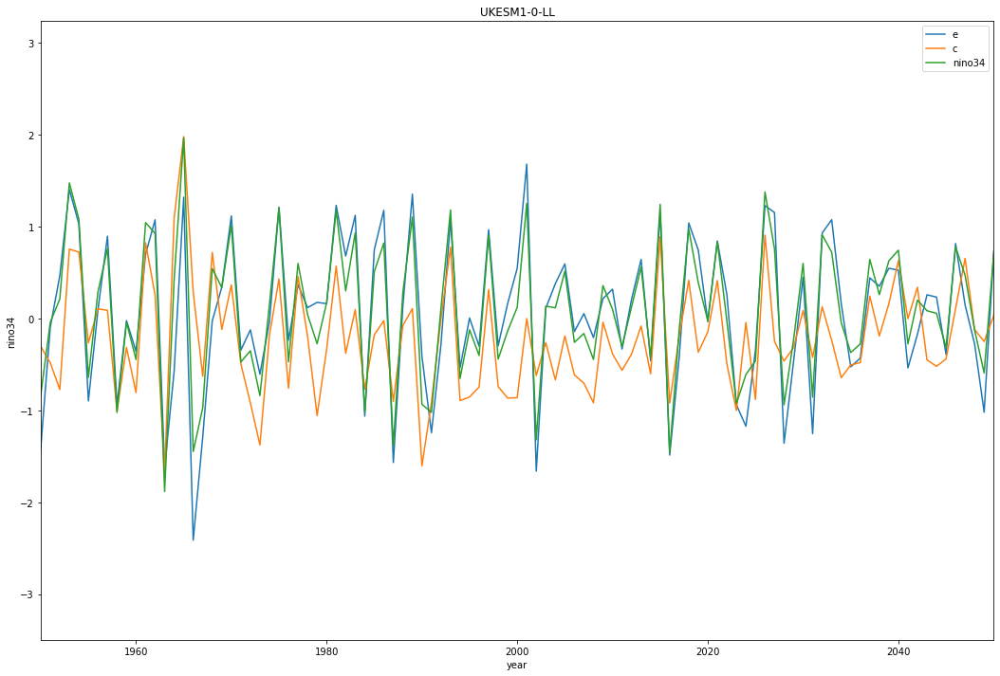

In [12]:
for iModel in ecIndexXr.model.values:

    fig = plt.figure(figsize=(18,12))

    ecIndexXr.sel(model=iModel).eIndex.plot()
    ecIndexXr.sel(model=iModel).cIndex.plot()

    tradIndexXr.sel(model=iModel).nino34.plot()

    plt.xlim([1950,2050])
    plt.legend(['e','c','nino34'])
    plt.title(iModel)
    
    plt.show()

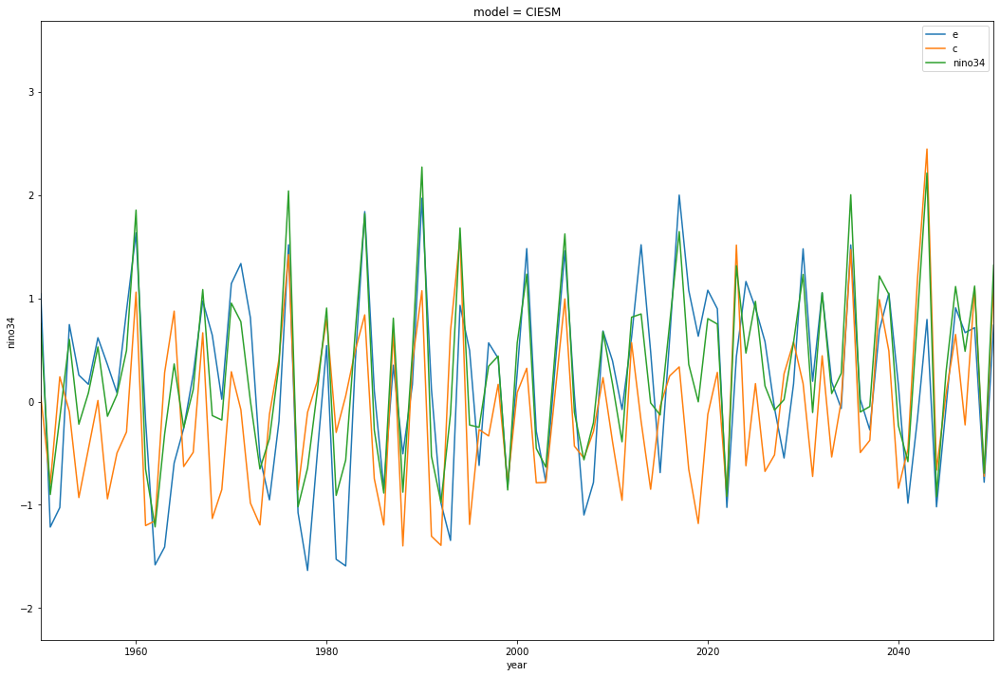

In [7]:
fig = plt.figure(figsize=(18,12))

ecIndexXr.sel(model='CIESM').eIndex.plot()
ecIndexXr.sel(model='CIESM').cIndex.plot()

tradIndexXr.sel(model='CIESM').nino34.plot()

plt.xlim([1950,2050])
plt.legend(['e','c','nino34'])

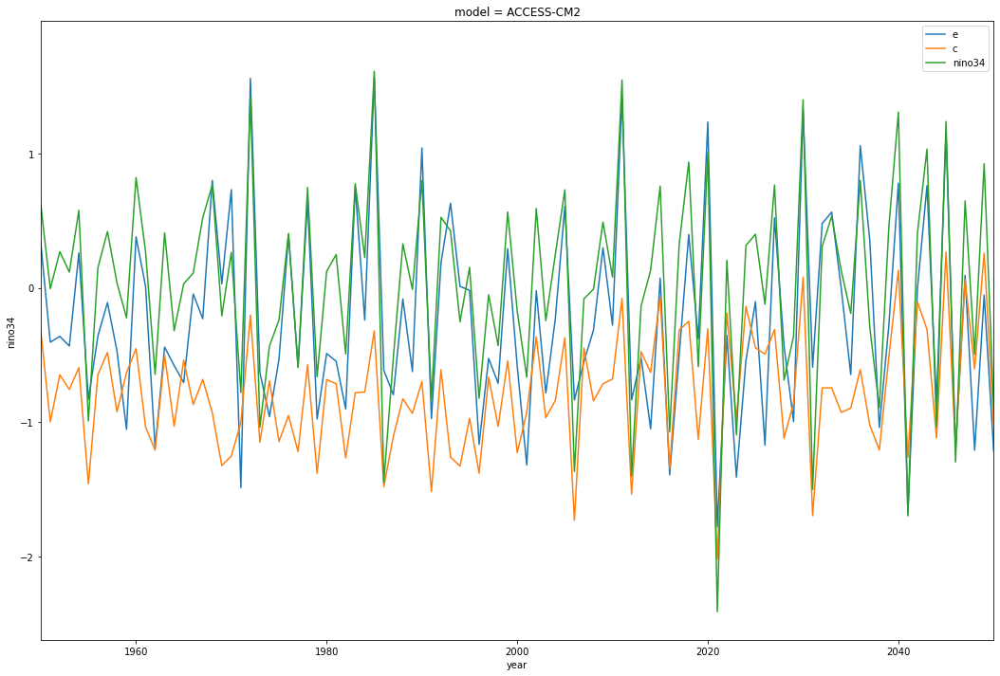

In [8]:
fig = plt.figure(figsize=(18,12))

ecIndexXr.sel(model='ACCESS-CM2').eIndex.plot()
ecIndexXr.sel(model='ACCESS-CM2').cIndex.plot()

tradIndexXr.sel(model='ACCESS-CM2').nino34.plot()

plt.xlim([1950,2050])
plt.legend(['e','c','nino34'])

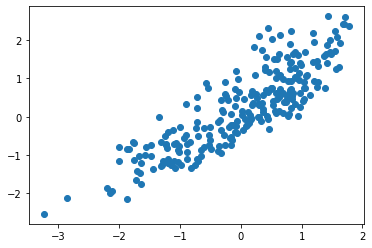

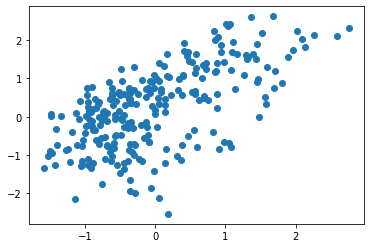

In [9]:
plt.scatter(
    ecIndexXr.sel(model='CESM2').eIndex,
    tradIndexXr.sel(model='CESM2').nino34
)

plt.show()

plt.scatter(
    ecIndexXr.sel(model='CESM2').cIndex,
    tradIndexXr.sel(model='CESM2').nino34
)

plt.show()

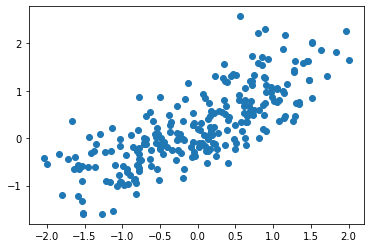

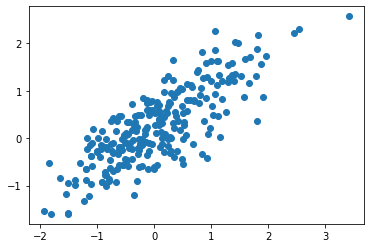

In [10]:
plt.scatter(
    ecIndexXr.sel(model='CIESM').eIndex,
    tradIndexXr.sel(model='CIESM').nino34
)

plt.show()

plt.scatter(
    ecIndexXr.sel(model='CIESM').cIndex,
    tradIndexXr.sel(model='CIESM').nino34
)

plt.show()

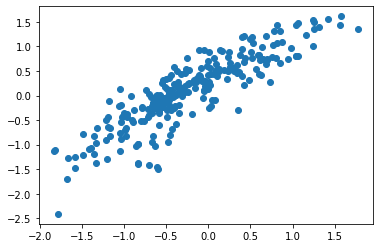

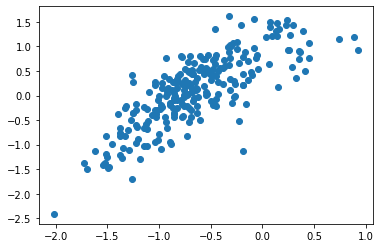

In [11]:
plt.scatter(
    ecIndexXr.sel(model='ACCESS-CM2').eIndex,
    tradIndexXr.sel(model='ACCESS-CM2').nino34
)

plt.show()

plt.scatter(
    ecIndexXr.sel(model='ACCESS-CM2').cIndex,
    tradIndexXr.sel(model='ACCESS-CM2').nino34
)

plt.show()

# 2. EOFs for individual models

The E/C index for for eastern/central ENSO is based on the principle components of pacific ocean SSTs.

The sign determined of the EOFs and their corresponding PC1 is arbitrary (no physical meaning), so to interpret positive and negative anomalies as eastern/central events, we need to strandardise them so they are all the same

In [6]:
#multipliers determined through visual inspection to give a 
#central/eastern anomaly for pc1 and a western anomaly for pc1
multipliers={'ACCESS-CM2':[1,1], 
    'ACCESS-ESM1-5':[1,1],
    'AWI-CM-1-1-MR':[-1,-1],
    'BCC-CSM2-MR':[1,1],
    'CAMS-CSM1-0':[1,-1],
    'CAS-ESM2-0':[1,-1],
    'CESM2':[1,-1], 
    'CESM2-WACCM':[1,1],
    'CIESM':[-1,-1], 
    'CMCC-CM2-SR5':[-1,1],
    'CMCC-ESM2':[-1,-1], 
    'CNRM-CM6-1':[1,1], 
    'CNRM-ESM2-1':[-1,1], 
    'CanESM5':[1,-1],
    'CanESM5-CanOE':[1,1], 
    'EC-Earth3':[1,-1], 
    'EC-Earth3-CC':[1,-1], 
    'EC-Earth3-Veg':[1,1],
    'EC-Earth3-Veg-LR':[1,-1], 
    'FIO-ESM-2-0':[1,-1],
    'GFDL-CM4':[1,1], 
    'GFDL-ESM4':[1,1], 
    'GISS-E2-1-G':[1,-1],
    'HadGEM3-GC31-LL':[1,1], 
    'HadGEM3-GC31-MM':[-1,-1], 
    'INM-CM4-8':[1,1], 
    'INM-CM5-0':[1,1],
    'IPSL-CM6A-LR':[1,-1], 
    'MCM-UA-1-0':[1,1], 
    'MIROC-ES2L':[-1,-1], 
    'MIROC6':[1,-1],
    'MPI-ESM1-2-HR':[1,-1], 
    'MPI-ESM1-2-LR':[1,1],
    'MRI-ESM2-0':[-1,-1], 
    'NESM3':[-1,-1],
    'NorESM2-LM':[-1,1], 
    'NorESM2-MM':[1,-1], 
    'UKESM1-0-LL':[1,-1] 
    }

Multiple each of those eofs by the multipliers to check the anomalies are the right way around

ACCESS-CM2
[1, 1]


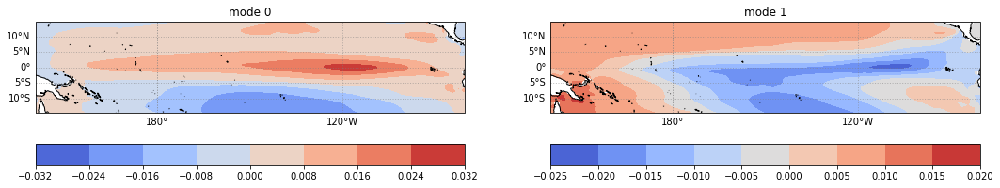

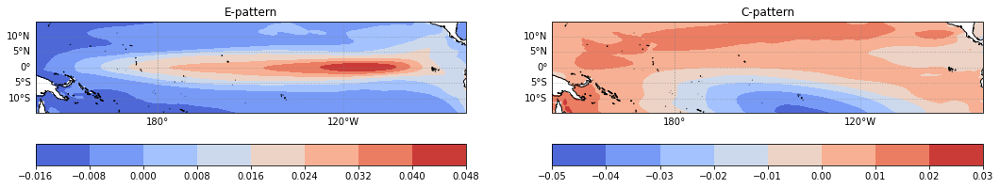

ACCESS-ESM1-5
[1, 1]


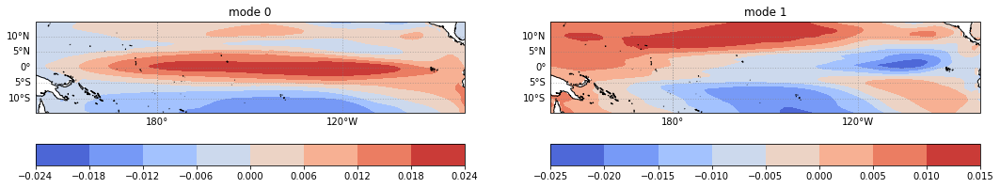

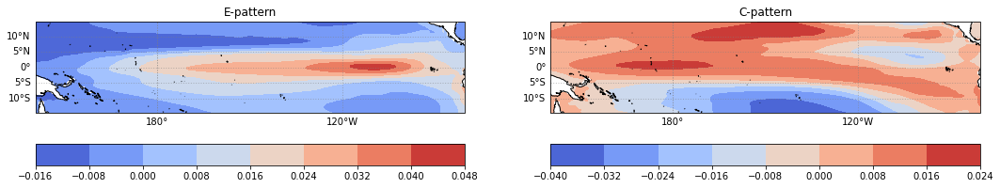

AWI-CM-1-1-MR
[-1, -1]
Input z must be 2D, not 1D
BCC-CSM2-MR
[1, 1]


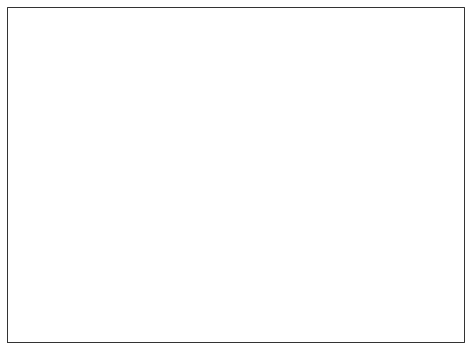

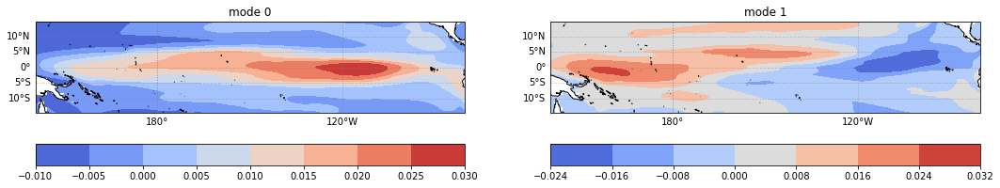

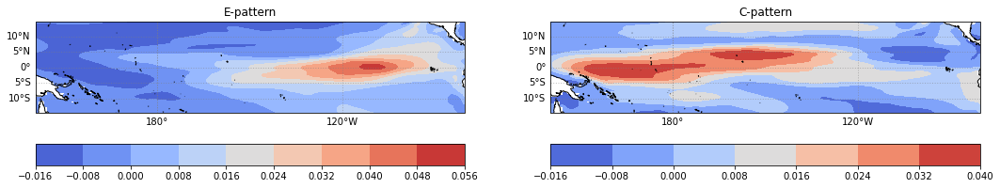

CAMS-CSM1-0
[1, -1]


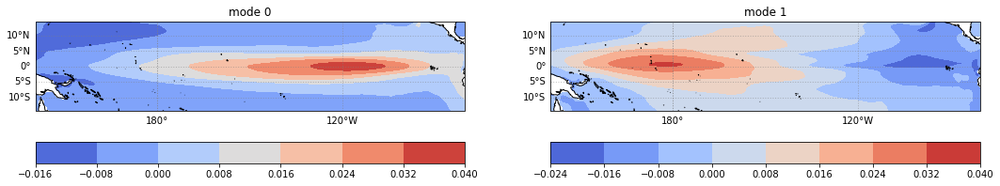

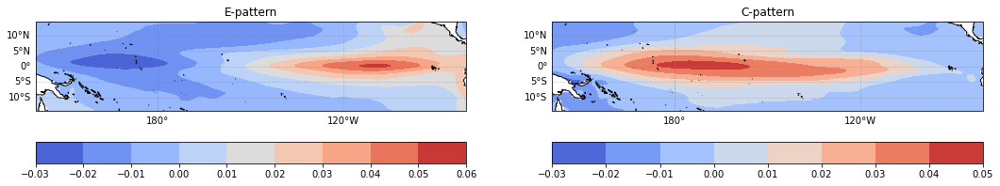

CAS-ESM2-0
[1, -1]


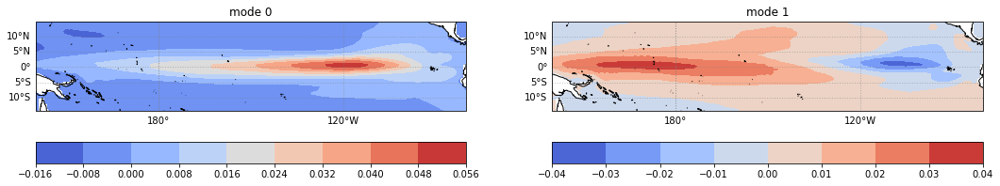

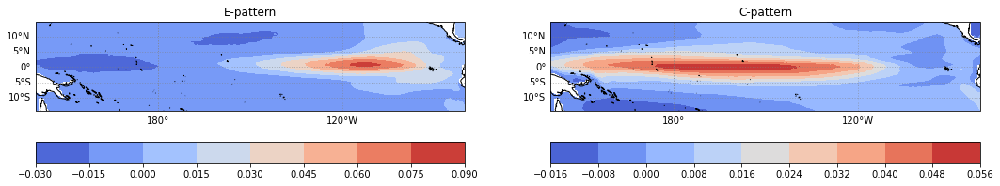

CESM2
[1, -1]


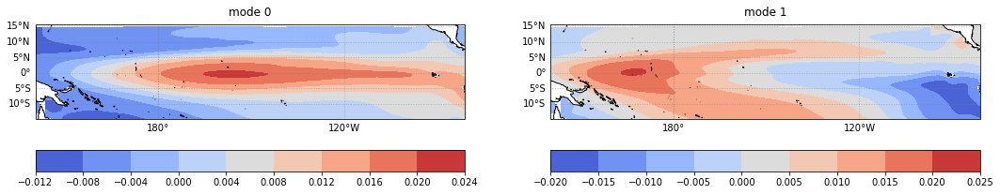

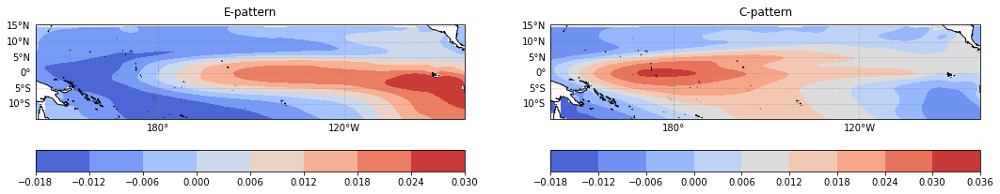

CESM2-WACCM
[1, 1]


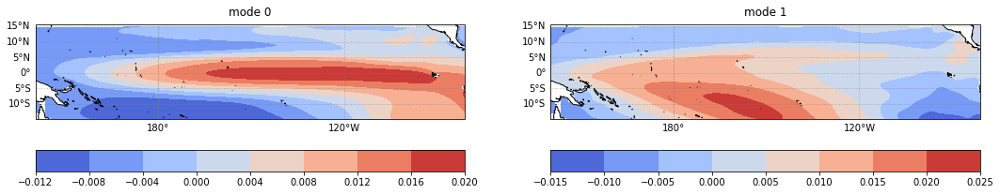

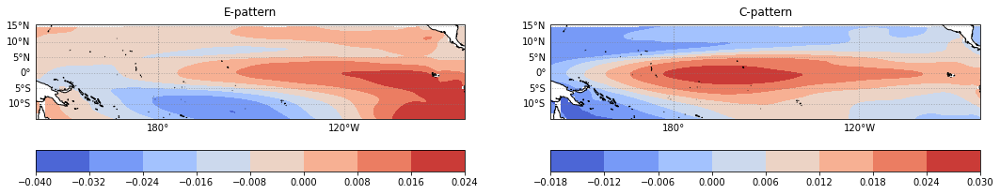

CIESM
[-1, -1]


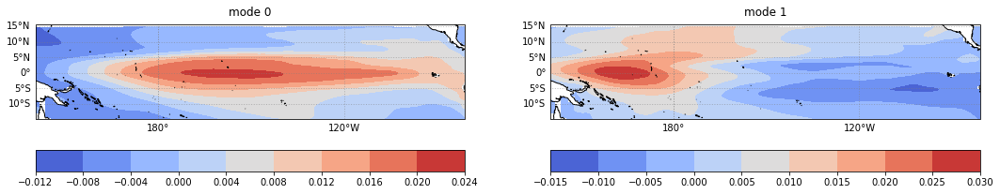

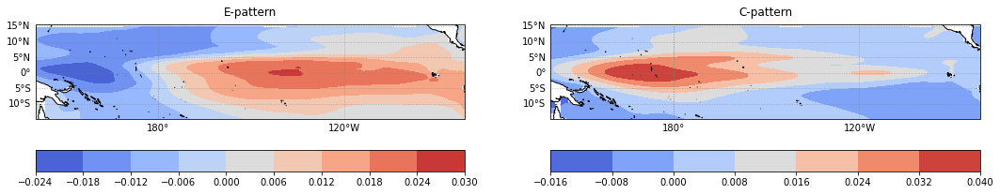

CMCC-CM2-SR5
[-1, 1]


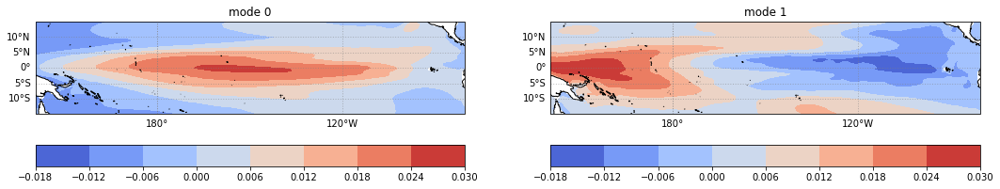

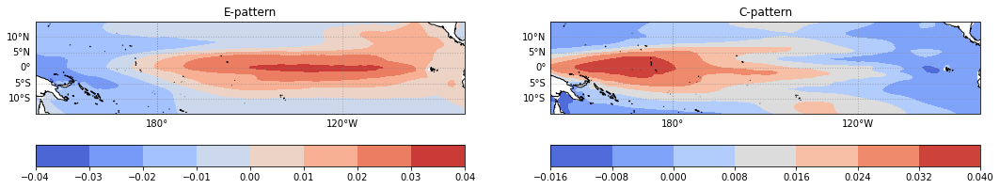

CMCC-ESM2
[-1, -1]


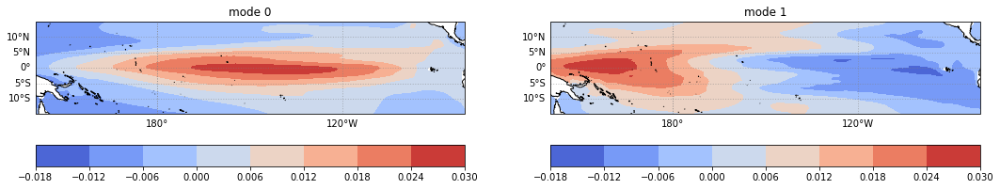

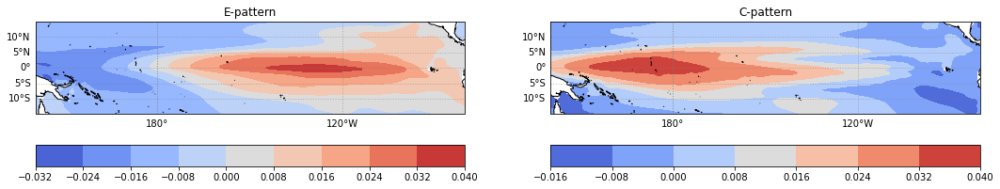

CNRM-CM6-1
[1, 1]


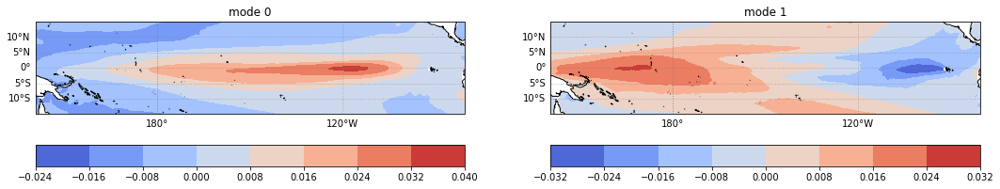

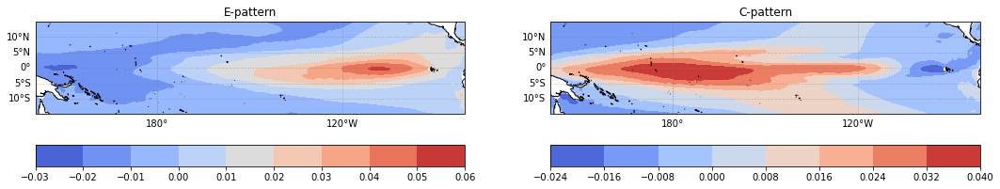

CNRM-ESM2-1
[-1, 1]


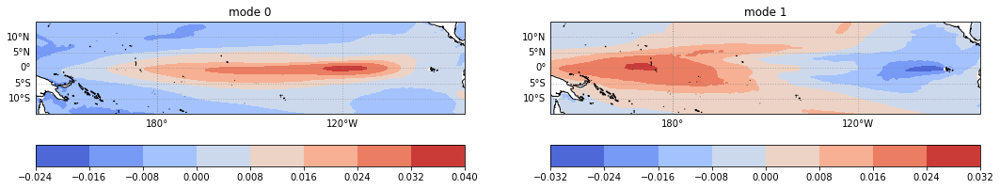

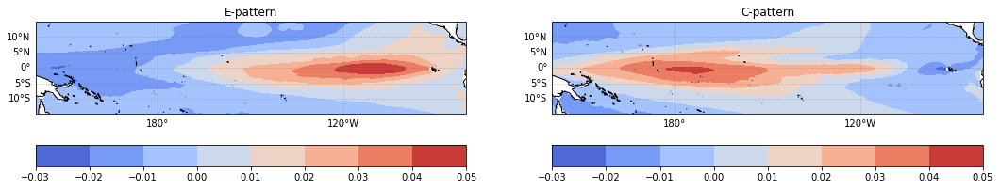

CanESM5
[1, -1]


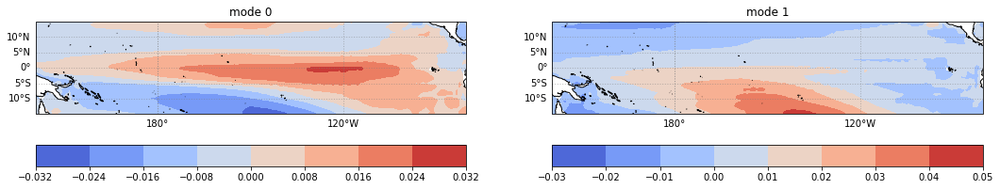

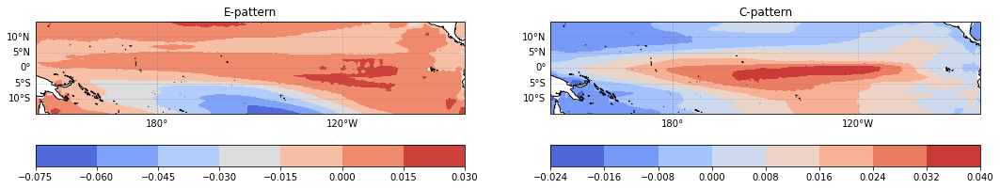

CanESM5-CanOE
[1, 1]


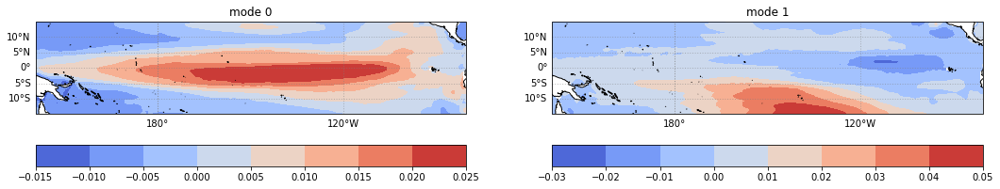

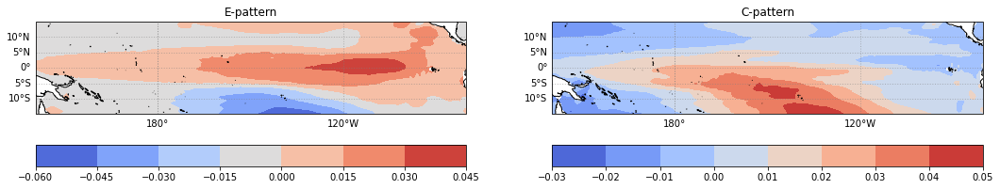

EC-Earth3
[1, -1]


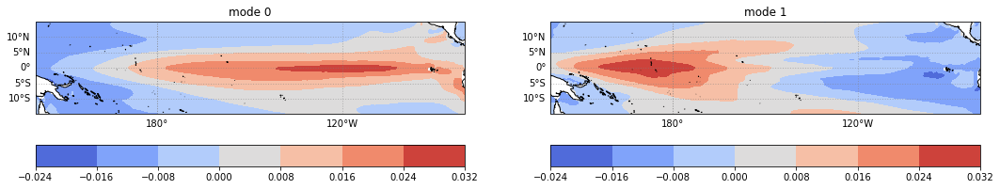

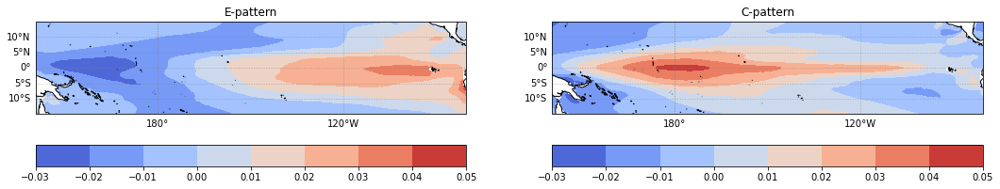

EC-Earth3-CC
[1, -1]


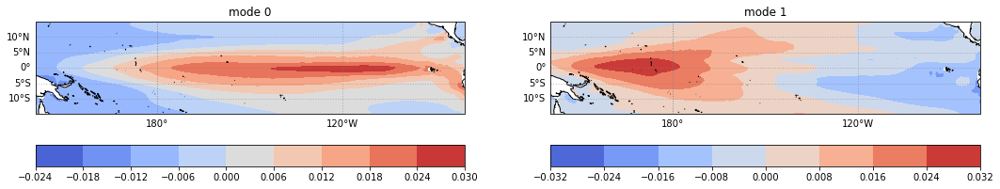

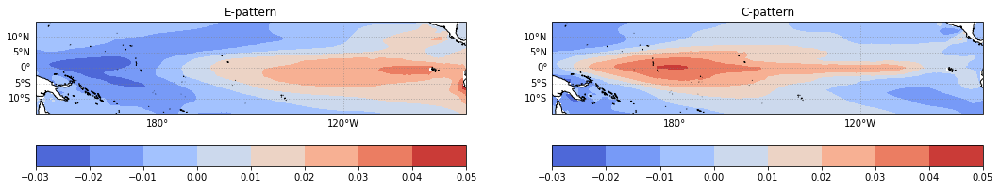

EC-Earth3-Veg
[1, 1]


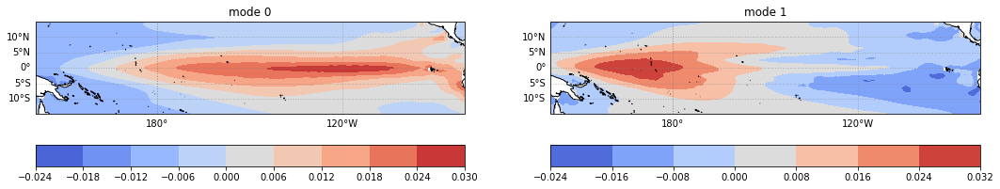

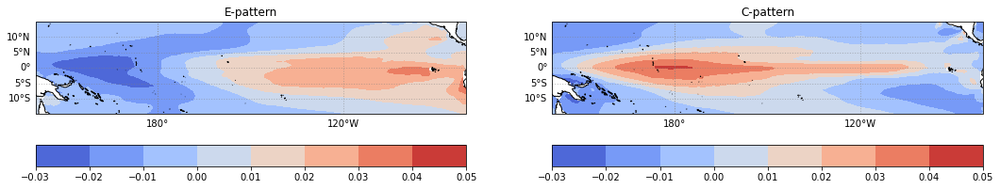

EC-Earth3-Veg-LR
[1, -1]


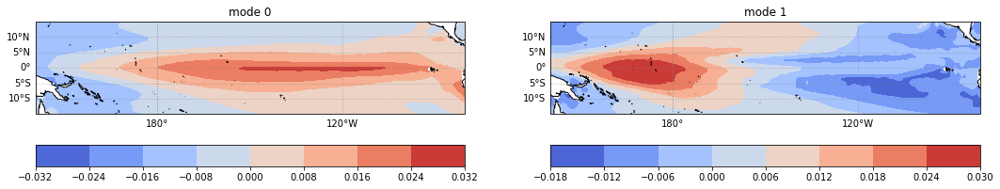

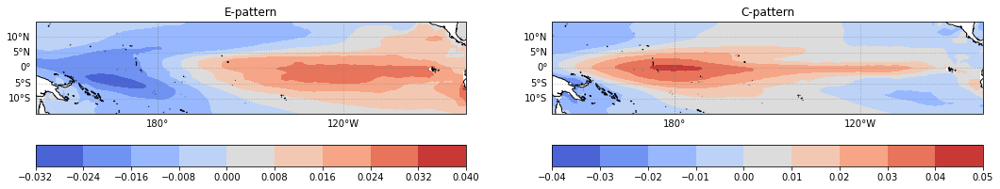

FIO-ESM-2-0
[1, -1]
'DataArray' object has no attribute 'lon'
GFDL-CM4
[1, 1]


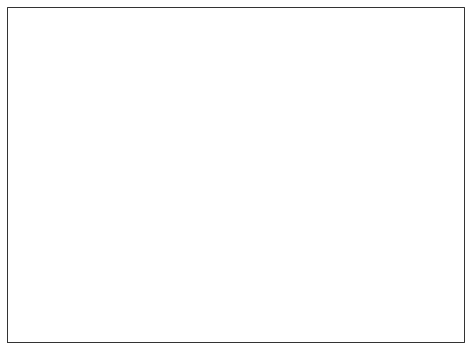

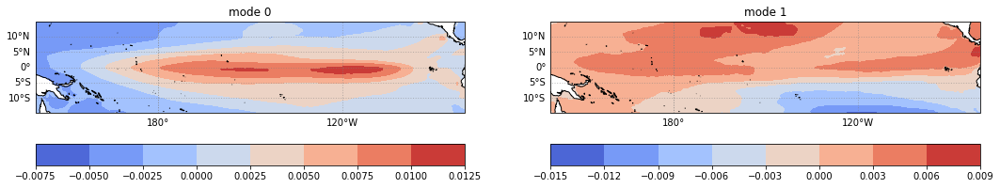

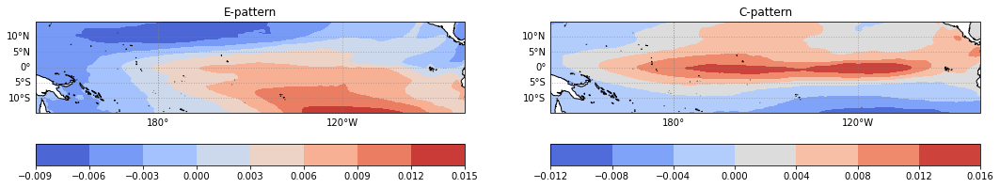

GFDL-ESM4
[1, 1]


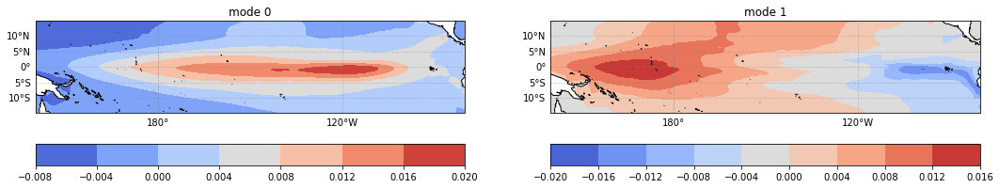

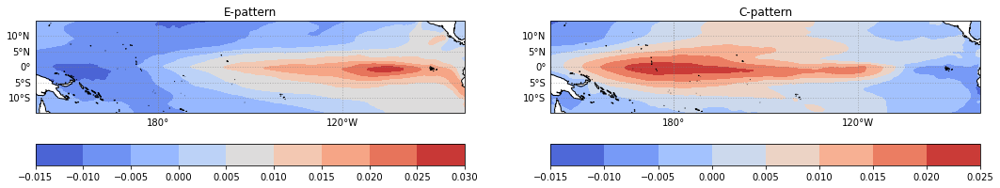

GISS-E2-1-G
[1, -1]


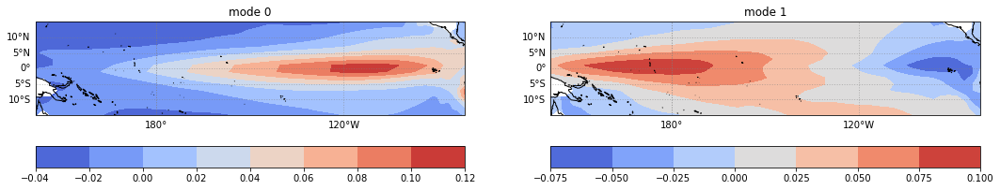

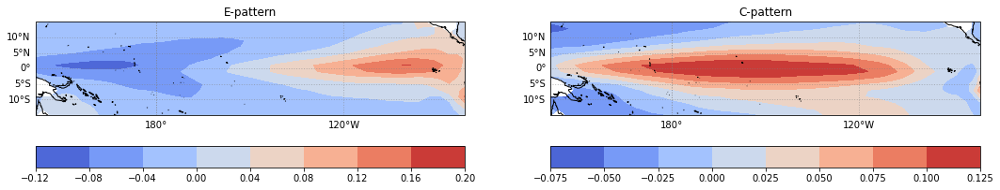

HadGEM3-GC31-LL
[1, 1]


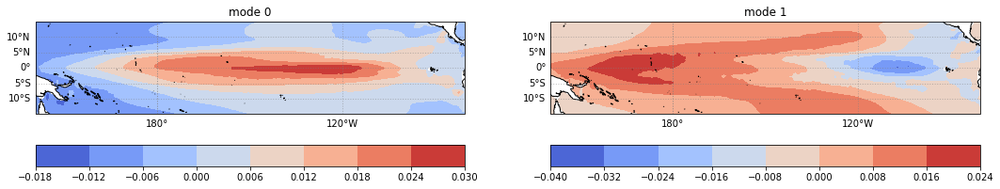

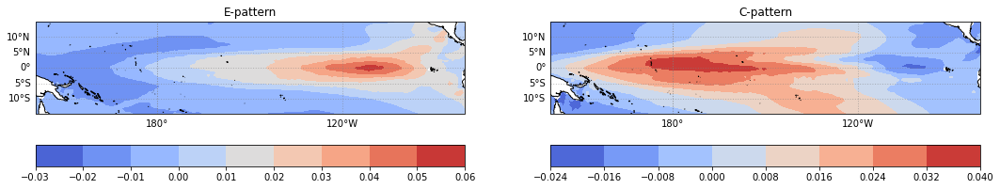

HadGEM3-GC31-MM
[-1, -1]


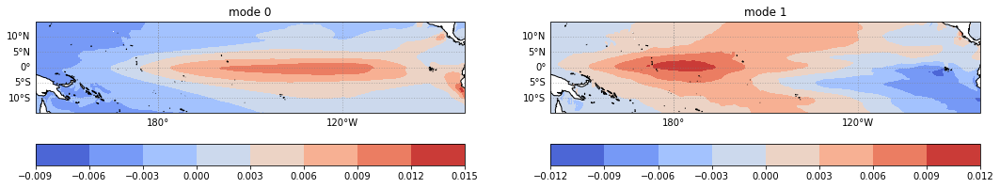

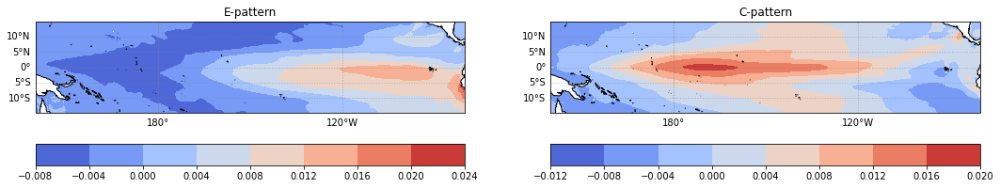

INM-CM4-8
[1, 1]


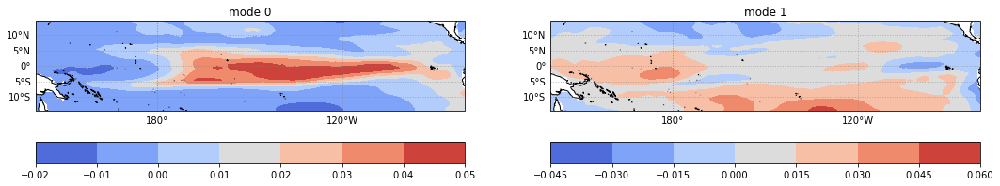

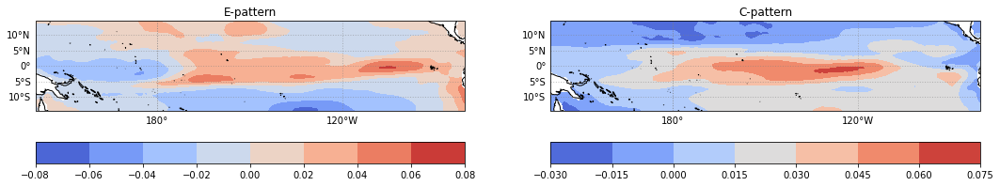

INM-CM5-0
[1, 1]


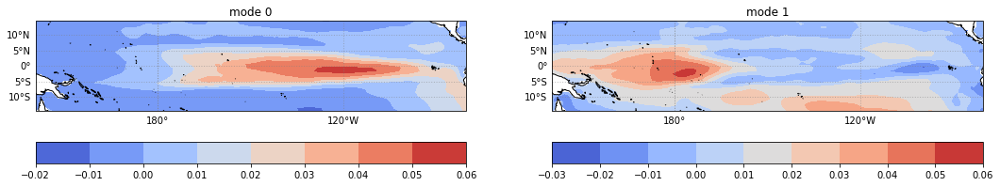

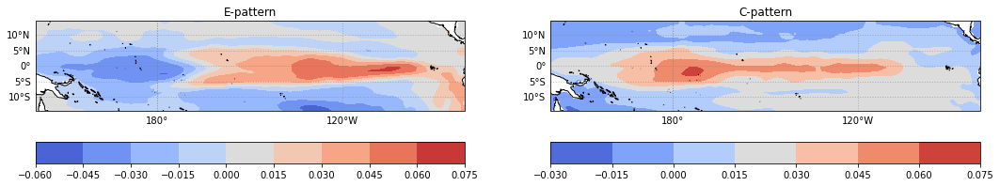

IPSL-CM6A-LR
[1, -1]


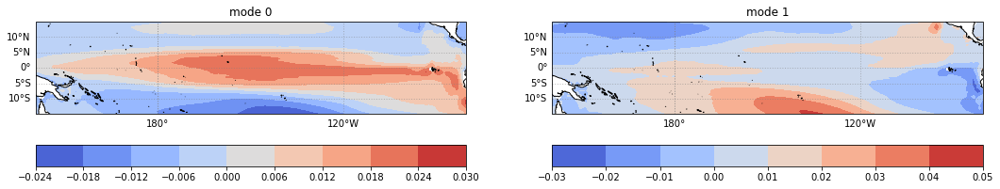

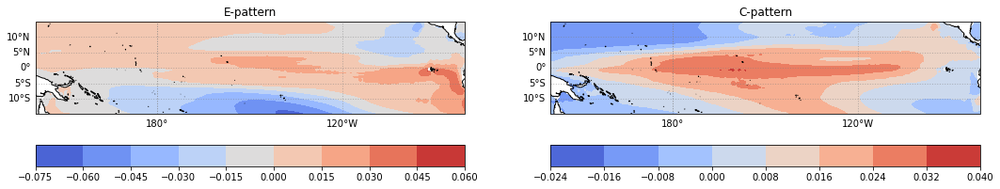

MCM-UA-1-0
[1, 1]


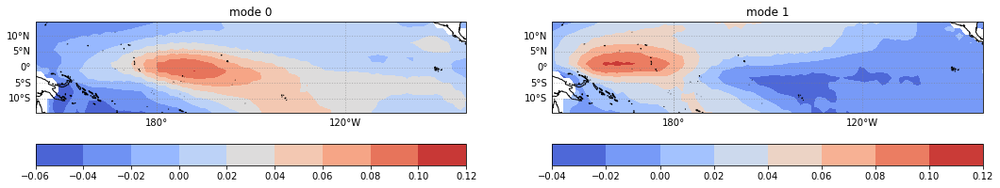

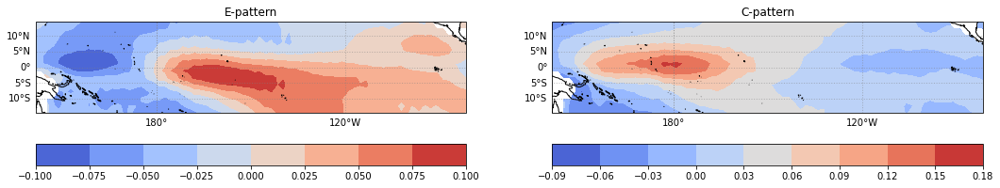

MIROC-ES2L
[-1, -1]


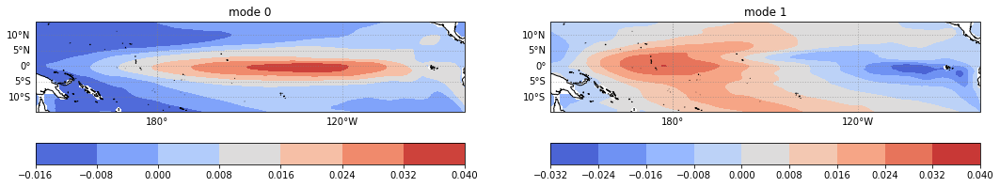

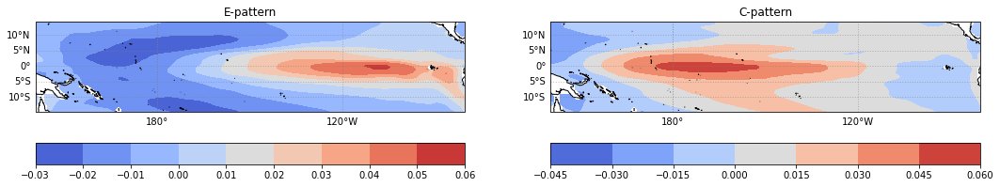

MIROC6
[1, -1]


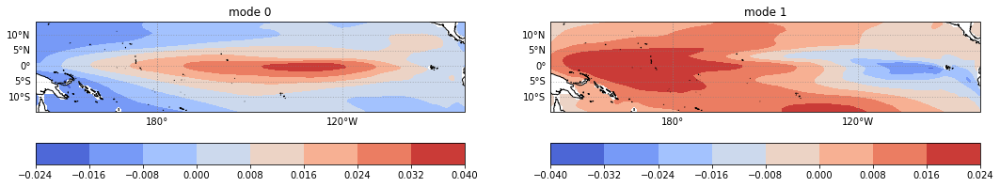

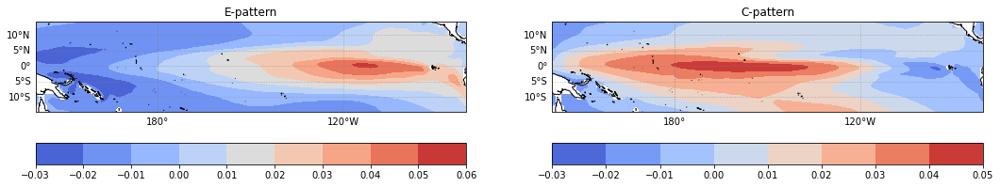

MPI-ESM1-2-HR
[1, -1]


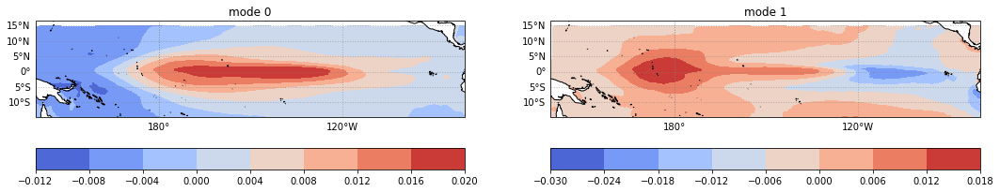

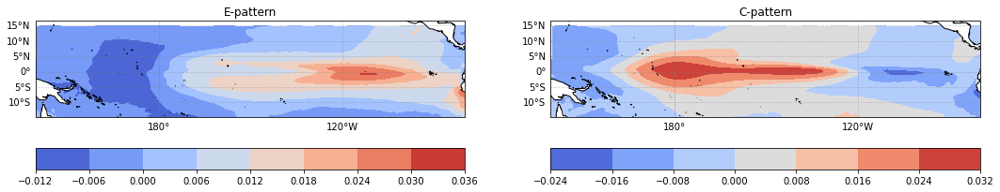

MPI-ESM1-2-LR
[1, 1]


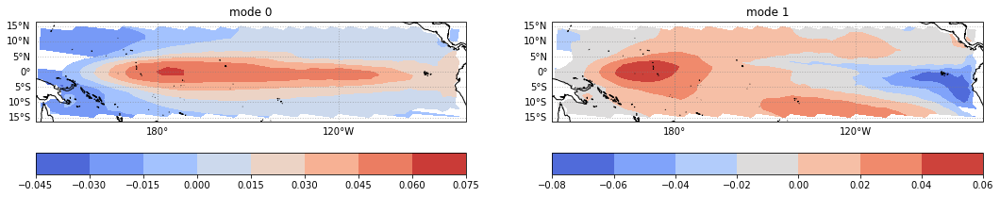

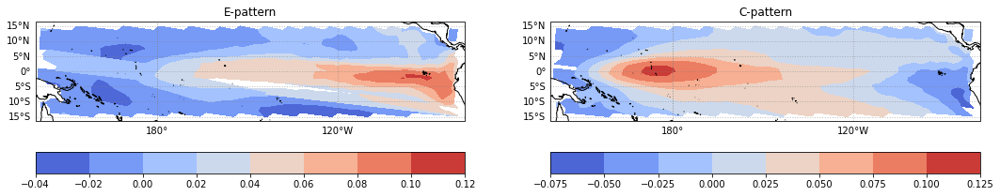

MRI-ESM2-0
[-1, -1]


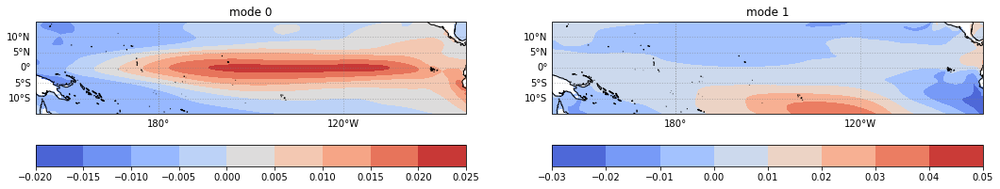

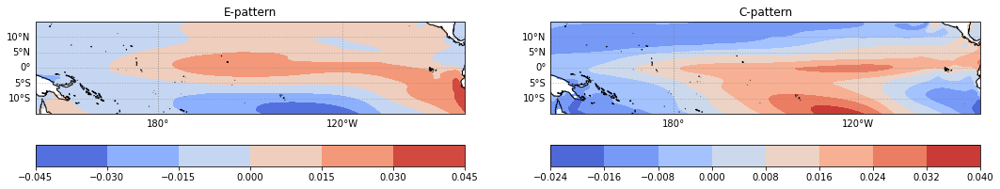

NESM3
[-1, -1]


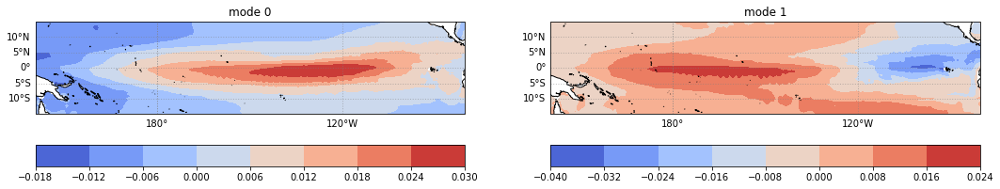

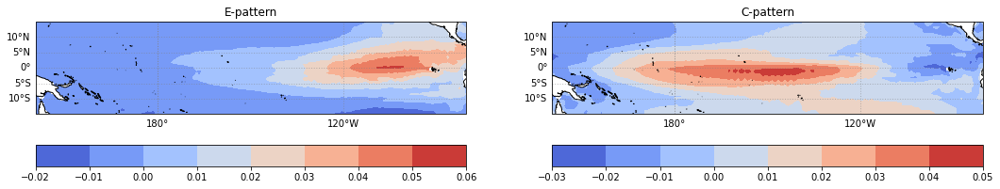

NorESM2-LM
[-1, 1]


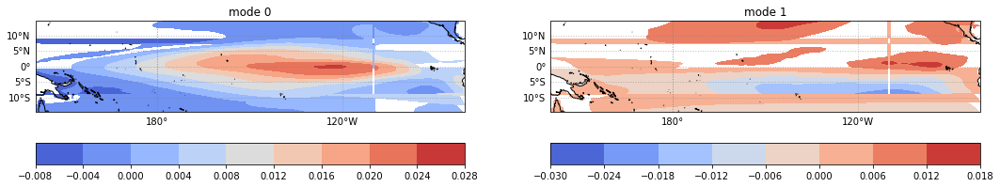

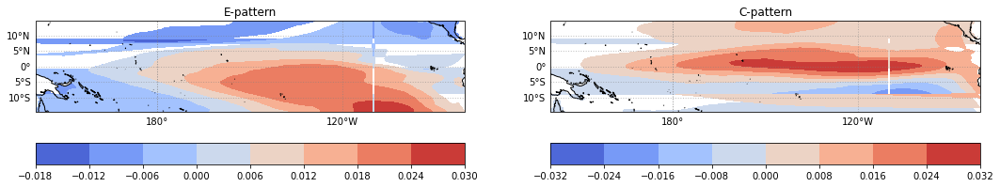

NorESM2-MM
[1, -1]


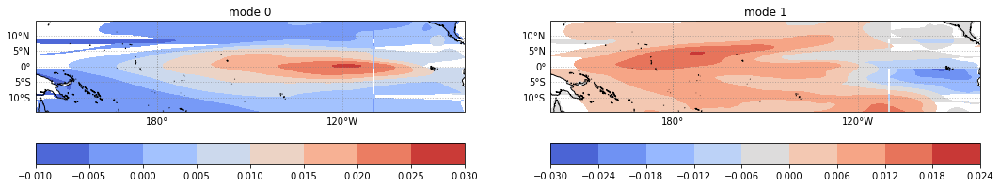

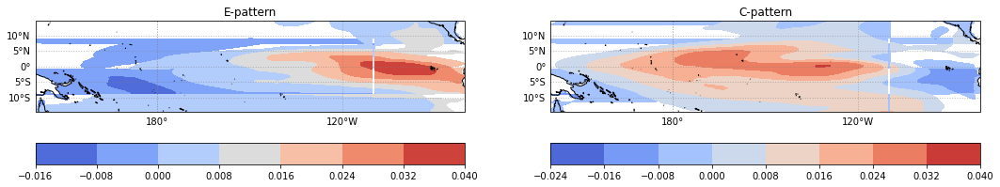

UKESM1-0-LL
[1, -1]


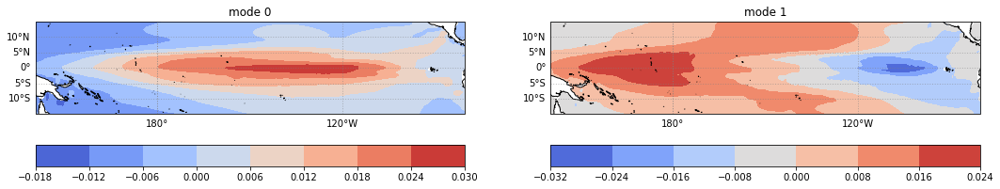

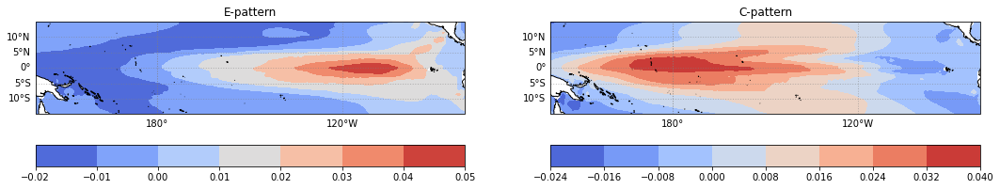

In [7]:
for iModel in modelSet:
    import numpy.polynomial as poly
    try:
        print(iModel[1])
        multiplyBy=multipliers[iModel[1]]
        print(multiplyBy)
        
        eofsXr=xarray.load_dataarray('results/cmipEcIndex/eof'+str(iModel[1])+'.nc')
        
        fig=plt.figure(figsize=(18,12))
        
        for mode in [0,1]:
            ax=fig.add_subplot(1,2,mode+1,
                           projection=ccrs.Miller(central_longitude=210))

            ec.ensoPlotter(multiplyBy[mode]*eofsXr.sel(mode=mode), ax)

            plt.title("mode " + str(mode))

        plt.show()
        
        fig=plt.figure(figsize=(18,12))
        
        ax=fig.add_subplot(1,2,1,
                       projection=ccrs.Miller(central_longitude=210))

        ec.ensoPlotter(multiplyBy[0]*eofsXr.sel(mode=0)-multiplyBy[1]*eofsXr.sel(mode=1), ax)

        plt.title("E-pattern")

        ax=fig.add_subplot(1,2,2,
                       projection=ccrs.Miller(central_longitude=210))

        ec.ensoPlotter(multiplyBy[0]*eofsXr.sel(mode=0)+multiplyBy[1]*eofsXr.sel(mode=1), ax)

        plt.title("C-pattern")
        
        plt.show()
        
    except Exception as e:
        print(e)
    

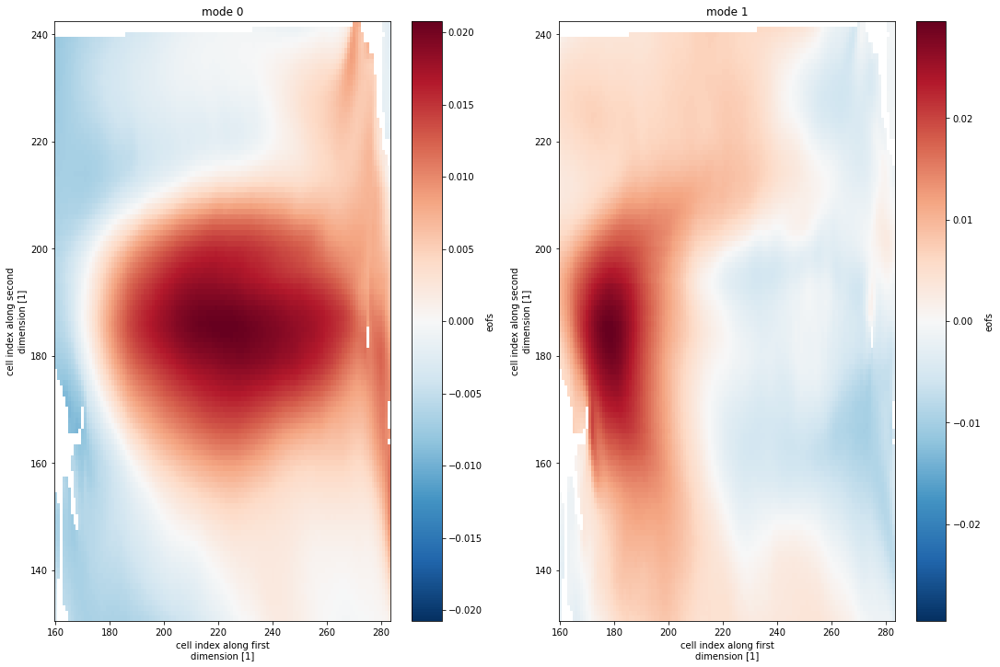

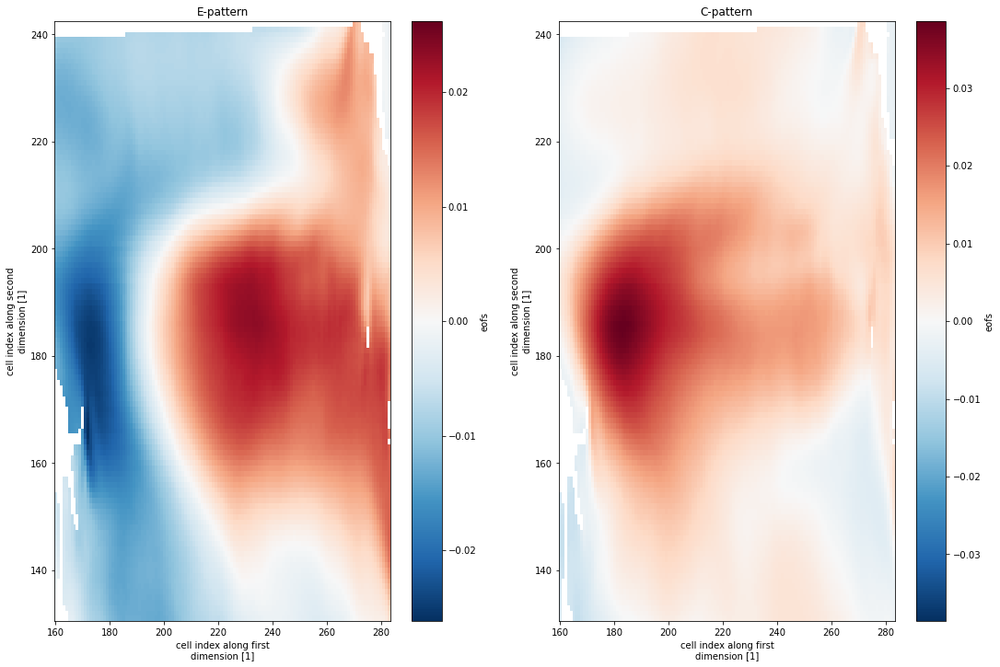

In [8]:
eofsXr=xarray.load_dataarray('results/cmipEcIndex/eofFIO-ESM-2-0.nc')

multiplyBy=multipliers['FIO-ESM-2-0']

fig=plt.figure(figsize=(18,12))

for mode in [0,1]:
    ax=fig.add_subplot(1,2,mode+1)

    (multiplyBy[mode]*eofsXr.sel(mode=mode)).plot()

    plt.title("mode " + str(mode))

plt.show()

fig=plt.figure(figsize=(18,12))

ax=fig.add_subplot(1,2,1)

(multiplyBy[0]*eofsXr.sel(mode=0)-multiplyBy[1]*eofsXr.sel(mode=1)).plot()

plt.title("E-pattern")

ax=fig.add_subplot(1,2,2)

(multiplyBy[0]*eofsXr.sel(mode=0)+multiplyBy[1]*eofsXr.sel(mode=1)).plot()

plt.title("C-pattern")

plt.show()